In [1]:
# import libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import confusion_matrix, make_scorer
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
import warnings
warnings.filterwarnings("ignore")


In [2]:
df = pd.read_csv('Wisconsin Original data.csv')

In [3]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [4]:
df = df.sample(frac=1)

In [5]:
df.iloc[:10]

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
205,879523,M,15.120,16.68,98.78,716.6,0.08876,0.09588,0.07550,0.04079,...,20.24,117.70,989.5,0.1491,0.33310,0.3327,0.12520,0.3415,0.09740,NaN
4,84358402,M,20.290,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.1374,0.20500,0.4000,0.16250,0.2364,0.07678,NaN
557,925236,B,9.423,27.88,59.26,271.3,0.08123,0.04971,0.00000,0.00000,...,34.24,66.50,330.6,0.1073,0.07158,0.0000,0.00000,0.2475,0.06969,NaN
261,888264,M,17.350,23.06,111.00,933.1,0.08662,0.06290,0.02891,0.02837,...,31.47,128.20,1218.0,0.1240,0.14860,0.1211,0.08235,0.2452,0.06515,NaN
9,84501001,M,12.460,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,...,40.68,97.65,711.4,0.1853,1.05800,1.1050,0.22100,0.4366,0.20750,NaN
170,87139402,B,12.320,12.39,78.85,464.1,0.10280,0.06981,0.03987,0.03700,...,15.64,86.97,549.1,0.1385,0.12660,0.1242,0.09391,0.2827,0.06771,NaN
32,85382601,M,17.020,23.98,112.80,899.3,0.11970,0.14960,0.24170,0.12030,...,32.09,136.10,1344.0,0.1634,0.35590,0.5588,0.18470,0.3530,0.08482,NaN
322,894855,B,12.860,13.32,82.82,504.8,0.11340,0.08834,0.03800,0.03400,...,21.08,92.80,599.5,0.1547,0.22310,0.1791,0.11550,0.2382,0.08553,NaN
282,89122,M,19.400,18.18,127.20,1145.0,0.10370,0.14420,0.16260,0.09464,...,28.65,152.40,1628.0,0.1518,0.37490,0.4316,0.22520,0.3590,0.07787,NaN
331,896864,B,12.980,19.35,84.52,514.0,0.09579,0.11250,0.07107,0.02950,...,21.95,99.21,634.3,0.1288,0.32530,0.3439,0.09858,0.3596,0.09166,NaN


In [6]:
df = df.drop(columns=['Unnamed: 32', 'id'])

In [7]:
df.shape

(569, 31)

In [8]:
df.dtypes

diagnosis                   object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst            float64
concave points_worst

In [9]:
df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [10]:
df.isnull().values.any()

False

In [11]:
df['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

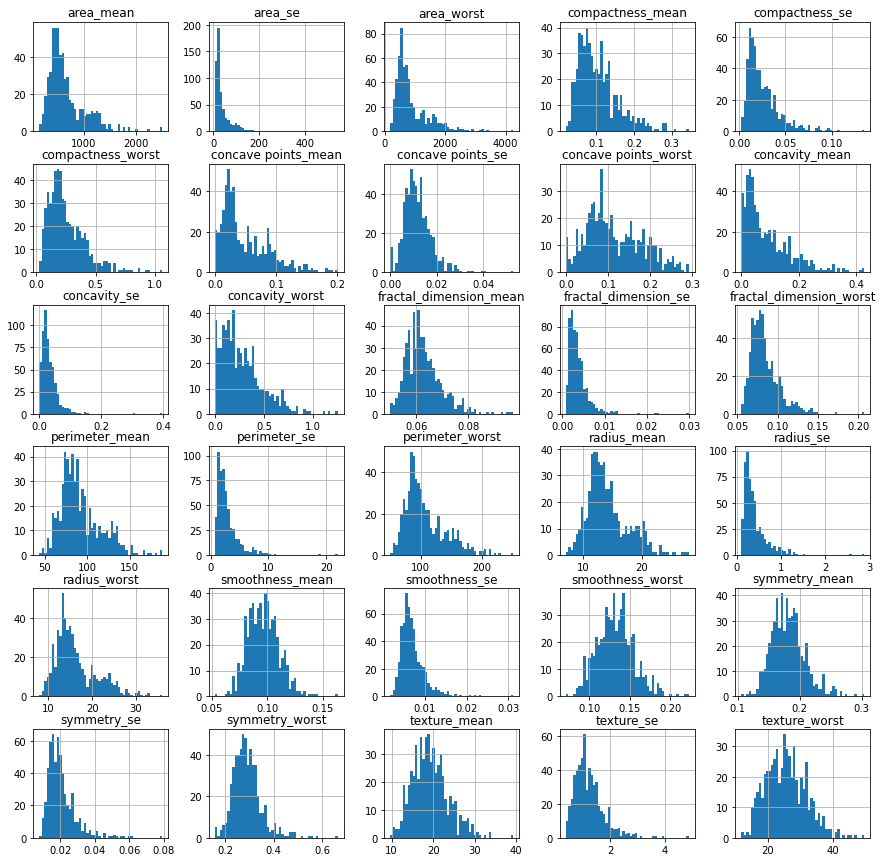

In [12]:
df.hist(bins=50, figsize=(15, 15))
plt.show()

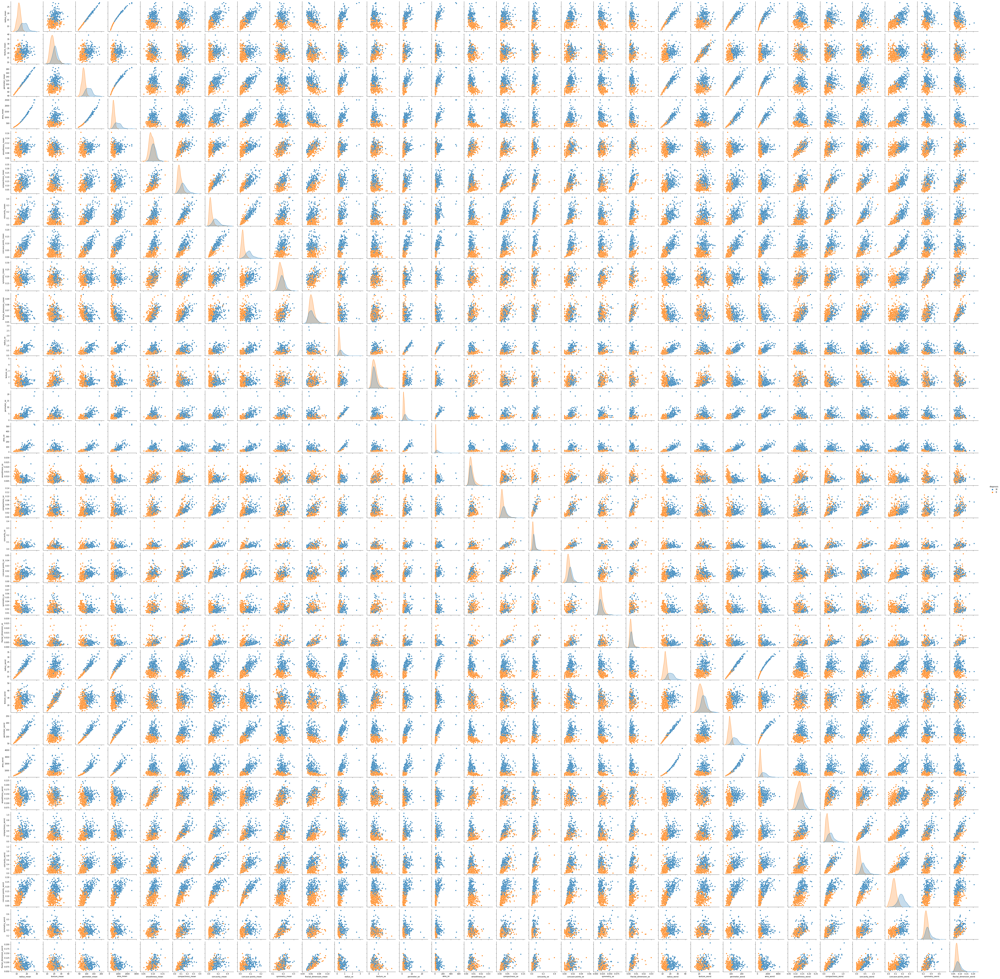

In [13]:
sns.pairplot(df, hue='diagnosis')

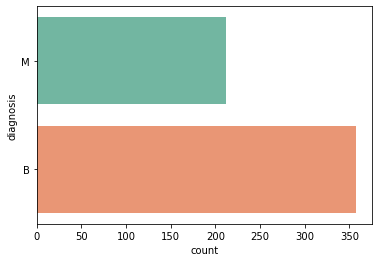

In [14]:
ax = sns.countplot(y='diagnosis', data=df, palette='Set2')

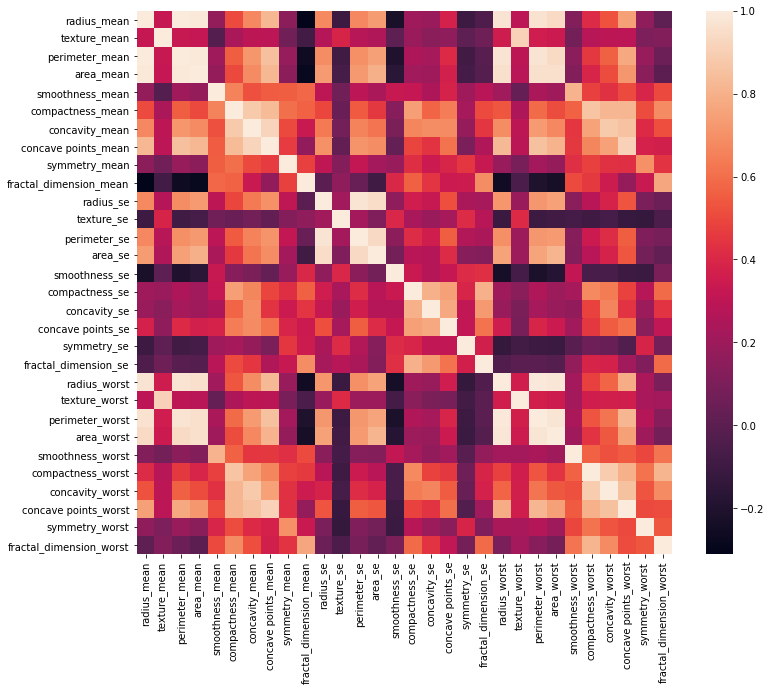

In [15]:
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(df.corr(), ax=ax)

diagnosis
B    357
M    212
dtype: int64


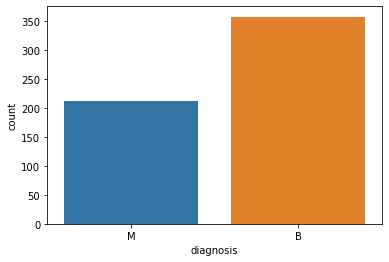

In [16]:
print(df.groupby('diagnosis').size())
sns.countplot(df['diagnosis'],label="Count")
plt.show()

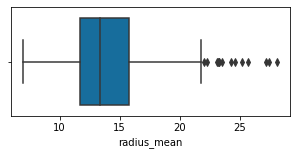

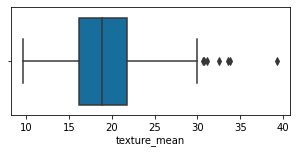

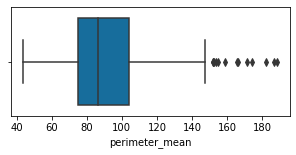

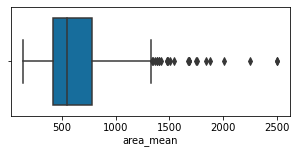

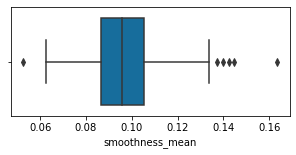

...

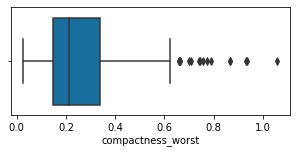

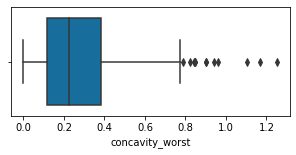

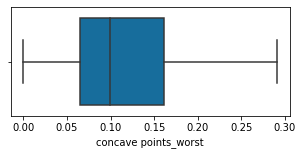

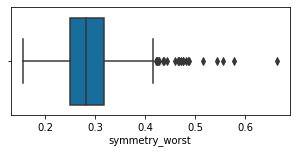

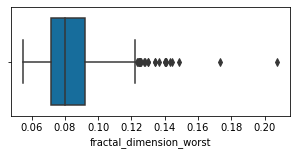

In [17]:
def boxPlot(dff):
    d = dff.drop(columns=['diagnosis'])
    for column in d:
        plt.figure(figsize=(5, 2))
        sns.boxplot(x=column, data=d, palette="colorblind")

boxPlot(df)

In [18]:
# Quartile range

Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
inter_quartile_range = Q3 - Q1

In [19]:
# quartiles and interquartile range

df_out = df[~((df < (Q1 - (1.5 * inter_quartile_range))) | (df > (Q3 + (1.5 * inter_quartile_range)))).any(axis=1)]
df.shape, df_out.shape

((569, 31), (398, 31))

In [20]:
# Separate labels and features
X = df_out.drop(columns=['diagnosis'])
y = df_out['diagnosis']

In [21]:
# Convert the M to 1 and B to 0
label = LabelEncoder()
y = label.fit_transform(y)
y[:20]

array([1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0])

In [22]:
# Spilt the train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
# we used 20% test data
# check the size before beginning
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((318, 30), (80, 30), (318,), (80,))

In [23]:
# cross validation function
def tn(y_true, y_pred):
    return confusion_matrix(y_true, y_pred)[0, 0]

In [24]:
def fp(y_true, y_pred):
    return confusion_matrix(y_true, y_pred)[0, 1]


In [25]:
def fn(y_true, y_pred):
    return confusion_matrix(y_true, y_pred)[1, 0]

In [26]:
def tp(y_true, y_pred):
    return confusion_matrix(y_true, y_pred)[1, 1]

In [27]:
def acc(y_true, y_pred):
    return accuracy(y_true, y_pred)

In [28]:
# custom accuracy
def accuracy(y_true, y_pred):
    cnf_matrix = confusion_matrix(y_true, y_pred)
    N = sum(map(sum, cnf_matrix))
    tp = cnf_matrix[1, 1]
    tn = cnf_matrix[0, 0]
    return round((tp + tn) / N, 2)

In [29]:
# cross validation purpose
scoring = {'accuracy': make_scorer(metrics.accuracy_score), 'prec': 'precision'}
scoring = {'tp': make_scorer(tp), 'tn': make_scorer(tn),
           'fp': make_scorer(fp), 'fn': make_scorer(fn),
           'acc': make_scorer(acc)}

In [30]:
def print_result(result):
    print("True Positive: ", result['test_tp'])
    print("True Negative: ", result['test_tn'])
    print("False Negative: ", result['test_fn'])
    print("False Positive: ", result['test_fp'])
    print("Accuracy: ", result['test_acc'])

In [31]:
# acc list and rcc list stores the output of each model
acc = []
roc = []

In [32]:
# Naive Bayes
model = GaussianNB()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)


In [33]:
ac = accuracy_score(y_test, y_pred)
acc.append(ac)
ac_train = accuracy_score(y_train, y_pred_train)
rc = roc_auc_score(y_test, y_pred)
roc.append(rc)
print("Naive Bayes : ")
print("Training Set Accuracy : ", ac_train)
print("Test Set Accuracy {0} ROC {1}".format(ac, rc))

Naive Bayes : 
Training Set Accuracy :  0.9339622641509434
Test Set Accuracy 0.9875 ROC 0.9722222222222222


In [34]:
# cross validation
result = cross_validate(model, X_train, y_train, scoring=scoring, cv=10)
print_result(result)

True Positive:  [8 8 7 6 8 8 8 6 8 6]
True Negative:  [23 23 23 22 24 23 20 24 22 19]
False Negative:  [0 0 1 2 0 0 0 2 0 2]
False Positive:  [1 1 1 2 0 1 4 0 1 4]
Accuracy:  [0.97 0.97 0.94 0.88 1.   0.97 0.88 0.94 0.97 0.81]


In [35]:
# Logistic Regression
LR = LogisticRegression()
LR.fit(X_train, y_train)
LR.score(X_train, y_train)
y_pred = LR.predict(X_test)
y_pred_train = model.predict(X_train)

In [36]:
# find accuracy
ac = accuracy_score(y_test, y_pred)
acc.append(ac)
ac_train = accuracy_score(y_train, y_pred_train)
# Code for ROC_AUC curve
rc = roc_auc_score(y_test, y_pred)
roc.append(rc)
print("****************************************************")
print("Logistic Regression : ")
print("Training Set Accuracy : ", ac_train)
print("Test Set Accuracy {0} ROC {1}".format(ac, rc))

****************************************************
Logistic Regression : 
Training Set Accuracy :  0.9339622641509434
Test Set Accuracy 0.975 ROC 0.9444444444444444


In [37]:
# cross validation shows how accurate our model is
result = cross_validate(LR, X_train, y_train, scoring=scoring, cv=10)
print_result(result)

True Positive:  [7 8 7 7 7 7 6 5 7 6]
True Negative:  [24 24 22 24 24 24 24 24 20 20]
False Negative:  [1 0 1 1 1 1 2 3 1 2]
False Positive:  [0 0 2 0 0 0 0 0 3 3]
Accuracy:  [0.97 1.   0.91 0.97 0.97 0.97 0.94 0.91 0.87 0.84]


In [38]:
# Support Vector Machine
model = SVC(gamma='auto', kernel='linear')
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)

In [39]:
ac = accuracy_score(y_test, y_pred)
acc.append(ac)
ac_train = accuracy_score(y_train, y_pred_train)
rc = roc_auc_score(y_test, y_pred)
roc.append(rc)
print("****************************************************")
print("Support Vector Machine : ")
print("Training Set Accuracy : ", ac_train)
print("Test Set Accuracy {0} ROC {1}".format(ac, rc))

****************************************************
Support Vector Machine : 
Training Set Accuracy :  0.9622641509433962
Test Set Accuracy 0.9875 ROC 0.9722222222222222


In [40]:
# cross validation
result = cross_validate(model, X_train, y_train, scoring=scoring, cv=10)
print_result(result)

True Positive:  [7 8 7 7 7 8 7 5 7 6]
True Negative:  [24 24 24 24 24 24 23 24 21 20]
False Negative:  [1 0 1 1 1 0 1 3 1 2]
False Positive:  [0 0 0 0 0 0 1 0 2 3]
Accuracy:  [0.97 1.   0.97 0.97 0.97 1.   0.94 0.91 0.9  0.84]


In [41]:
# KNN
model = KNeighborsClassifier(n_neighbors=9, n_jobs=-1)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)

In [42]:
ac = accuracy_score(y_test, y_pred)
acc.append(ac)
ac_train = accuracy_score(y_train, y_pred_train)
rc = roc_auc_score(y_test, y_pred)
roc.append(rc)
print("****************************************************")
print("K-Nearest Neighbors : ")
print("Training Set Accuracy : ", ac_train)
print("Accuracy {0} ROC {1}".format(ac, rc))

****************************************************
K-Nearest Neighbors : 
Training Set Accuracy :  0.9276729559748428
Accuracy 0.9625 ROC 0.9363799283154122


In [43]:
# cross validation
result = cross_validate(model, X_train, y_train, scoring=scoring, cv=10)
print_result(result)


True Positive:  [7 8 5 7 5 7 6 4 6 6]
True Negative:  [23 24 22 24 23 24 24 24 22 21]
False Negative:  [1 0 3 1 3 1 2 4 2 2]
False Positive:  [1 0 2 0 1 0 0 0 1 2]
Accuracy:  [0.94 1.   0.84 0.97 0.88 0.97 0.94 0.88 0.9  0.87]


In [44]:
# Random Forest
model = RandomForestClassifier(n_estimators=20, max_depth=10)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)

In [45]:
ac = accuracy_score(y_test, y_pred)
acc.append(ac)
ac_train = accuracy_score(y_train, y_pred_train)
rc = roc_auc_score(y_test, y_pred)
roc.append(rc)
print("****************************************************")
print("Random Forest : ")
print("Training Set Accuracy : ", ac_train)
print("Accuracy {0} ROC {1}".format(ac, rc))

****************************************************
Random Forest : 
Training Set Accuracy :  1.0
Accuracy 0.9625 ROC 0.9166666666666667


In [46]:
# cross validation
result = cross_validate(model, X_train, y_train, scoring=scoring, cv=10)
print_result(result)


True Positive:  [8 8 7 6 7 7 7 4 6 6]
True Negative:  [23 24 23 23 23 24 24 24 22 21]
False Negative:  [0 0 1 2 1 1 1 4 2 2]
False Positive:  [1 0 1 1 1 0 0 0 1 2]
Accuracy:  [0.97 1.   0.94 0.91 0.94 0.97 0.97 0.88 0.9  0.87]


Text(0.5, 0, 'Algortihms')

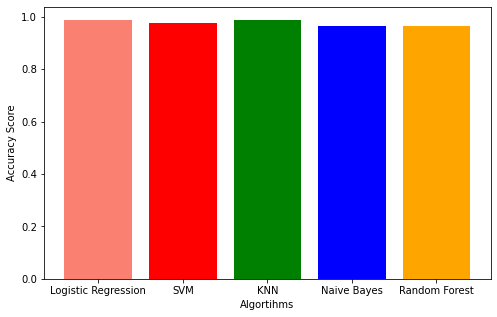

In [47]:
# accuracy score
plt.figure(figsize=(8, 5))
plt.bar(['Logistic Regression', 'SVM', 'KNN', 'Naive Bayes', 'Random Forest'], acc,
        color=['salmon', 'r', 'g', 'b', 'orange'], label='Accuracy')
plt.ylabel('Accuracy Score')
plt.xlabel('Algortihms')

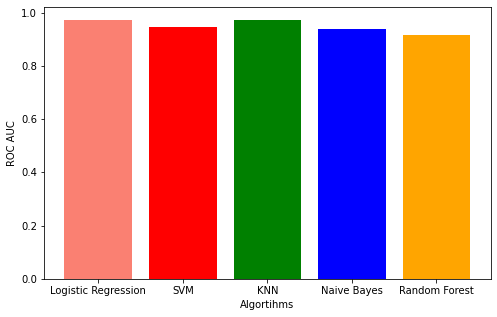

In [48]:
# roc-auc
plt.figure(figsize=(8, 5))
plt.bar(['Logistic Regression', 'SVM', 'KNN', 'Naive Bayes', 'Random Forest'], roc,
        color=['salmon', 'r', 'g', 'b', 'orange'], label='ROC AUC')
plt.ylabel('ROC AUC')
plt.xlabel('Algortihms')
plt.show()